###### Style Transfer

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

La idea de este trabajo final es reproducir el siguiente paper:

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta. 

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

# En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma.

# Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes.

Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

### Modificaciones al codigo original y algunos comentarios generales:
1. Se modifico la style_loss para utilizar la misma normalización que en el articulo.

2. Se agrego otra total_variation_loss como ejemplo. 

3. Se modifico el input para poder utilizar, ademas de la imagen de content como punto de partida, una imagen de ruido blanco como mencionado en el articulo.

4. Se agrego algunas lineas de codigos para poder dibujar un grafico de la loss y comparar la distribuciones de los canales de colores. 

5. Se agrego algunos notebooks opcionales para demontrar de manera mas grafica y simple algunos conceptos presentados en el artículo y también para apoyar algunas afirmaciones expuestas en las repuestas de este notebook. Los notebooks y programa adicionales son:

   a. Trabajo_Final_CNN_Content. Este notebook extraer los features ligados a la imagen content

   b. Trabajo_Final_CNN_Style. Este notebook extrae los features ligados a la imagen de estilo. 

   c. Style_Transfert_Tensor_Flow.py. Este programa de python implementa dos optimizadores distinctos: SGD básico y Adam. Lo ideal habria sido integrar estos optimizadores en esta notebook pero no eran disponibles en scipy.optimizadores. Probando con otros de scipy no obtuve resultados interesantes, tal vez porque el tuneo no es trivial (mas detalle sobre este punto en la notebook de optimizadores). Por lo tanto utilize otra implementación utilizando keras y tensor flow lo mas parecido posible a esta; la diferencia mas grande obviomaente siendo como se implementa los optimizadores de Keras en este contexto. Mi idea era implementarlo en una jupyter notebook: Trabajo_Final_CNN_Optimizadores pero por razones que no pude elucidar el programa monstraba un error que no pude arreglar aunque el script python corria perfectamente bien en el mismo environment. Por eso presento los resultados aca la corrida de python. El jupyter notebook esta adjunto al paquete de toda forma.

6. Todas las imagenes fueron generado en una Predator G9-791 con un i-7 6700-HQ CPU, 2.6 GHz y 16 GB de RAM. OS is windows 10. Se utilizo la distribución de Anaconda 1.10.0, Spyder 4.1.5 y Jupyter Notebook 6.1.4. TensorFlow 2.1.0, keras 2.3.1 y python 3.7.9.  

In [1]:
# Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte 
# el contenido. A tal fin utilizaremos imágenes disponibles en la web.
# Imagen para estilo
# https://wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
# Imagen para contenido
# https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg
# Creamos el directorio para los archivos de salida
#!mkdir /content/output
folder = 'D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/'

In [2]:
from keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b,fmin_tnc
import time
import argparse
import tensorflow as tf
from tensorflow import keras

from keras.applications import vgg19
from keras import backend as K
from pathlib import Path
from matplotlib import pyplot as plt

Using TensorFlow backend.


In [3]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida
# result_prefix = Path("/content/output")
base_image_path = f'{folder}Tuebingen_Neckarfront.jpg'
# se_image_path =  f'{folder}CONAE-010.jpg' 
# base_image_path =  f'{folder}Raymonde.jpg'
style_image_path = f'{folder}composition-vii.jpg'
# style_image_path = f'{folder}La_noche_estrellada1.jpg'
# style_image_path = f'{folder}Claude_Monet__Madame_Monet_and_Her_Son.jpg'
# style_image_path = f'{folder}Shipwreck_turner.jpg'
# style_image_path = f'{folder}Edvard_Munch_1893_The_Scream.jpg'
# style_image_path = f'{folder}Pablo_Picasso_1913-14_L_Homme_aux_cartes_oil_on_canvas.jpg'
result_prefix = f'{folder}output/run_2a/'
iterations = 30

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

Respuesta:


Son los factores multiplicativos que pesan la loss de content y la loss de style. 
En la notación del articulo, syle_weight = beta y content_weight = alpha. 
Lo importante no es el valor absoluto de cada uno pero la relación content_weight/style_style. 
La razón que utilizaron en el articulo fue 10-3 o 10-4. 
total_variation_weight es un peso para un elemento adicional de la loss que 
produce un filtro que mejora la calidad del resultado final. 

In [4]:
total_variation_weight = 1
content_weight = 1
style_weight = 1000

In [5]:
# Definimos el tamaño de las imágenes a utilizar, se genera la imagen de ruido y se 
# captura el promedio de los canales de colores de la imagen de estilo
width, height = load_img(base_image_path).size
# img_nrows = height
img_nrows = 400
img_ncols = int(width * img_nrows / height)
noise_matrix = np.random.uniform(0,255,size=(img_nrows,img_ncols,3))
noise = np.clip(noise_matrix, 0, 255).astype('uint8')
save_img(f'{folder}white_noise_image.jpg',noise)
noise_image_path = f'{folder}white_noise_image.jpg'
w = img_to_array(load_img(style_image_path , target_size=(img_nrows, img_ncols)))
list_media = np.mean(w, axis=tuple(range(w.ndim-1)))
list_media_r = list_media[0]
list_media_g = list_media[1]
list_media_b = list_media[2]

# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

Respuesta:

load_img levanta una imagen y np.expand_dims es una función de numpy que agrega # una dimensión, creando un tensor mas grande. Ejemplo: x = np.array([[1,2],[3,4]]) x es una matriz de 2 por 2 Si definimos y = np.expand_dims(x, axis=0) y es un tensor que tiene una dimensión zero nueva, cada elemento en este eje es una matriz. Incialmente, y tiene solamente un elemento en este nuevo eje y[0] es una matriz de 2 por 2. Si definimos z = np.expand_dims(x, axis=1)  z[0] y z[1] son una lista de 2 elementos Es necesario por que en el projimo paso se necesita como input: [1,img_nrows, img_ncols,3] (en este trabajo el primer input es 1 porque hay una sola imagen a preprocesar).

vgg19.preprocess_input(img) toma como input un np.array con 3 canales de colores y lo transforma en un numpy array con type float32 con la convención BGR que luego puede ser ingerido por la VGGn-19. 

In [6]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

Respuesta:

Respuesta: returna la salida del VGG-net en una imagen RGB habitual (valores entero entre 0 y 255 en lugar de float  y no centrado). 103.939, 116.779 y 123.68 son las medias de los canales Blue, Green y Red para las imagens de ImagNet. Como no modificamos los pesos, utilizamos estas media spara recobrar las medias de los canales. Luego de inversa el oprden para obtener una salida en RGB. El clip es para asegurar que no tenemos valores fuera del rango 0, 255.

No obstante, ubno puede querer modificar lso valores medio para conservar la meda de colores de la imagen de contenido o de estilo. Para todas las imagenes calculadas como parate de la  repuesta a al pregunta 8, conserve la media de la Imagen Net. En el caso de las imagenes calculadas para responder a la pregunta 9, utilize la media de la imagen de estilo. Se puede apreciar el resultado en las corridas 12 y 14. 

In [7]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # x[:, :, 0] += list_media[2]
    # x[:, :, 1] += list_media[1]
    # x[:, :, 2] += list_media[0]
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [8]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_image = K.variable(preprocess_image(style_image_path))

In [9]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

Aclaración:

La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

In [10]:
# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_image,
                              combination_image], axis=0)

In [11]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor, weights='imagenet', include_top=False,pooling='avg')
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram?¿Para qué se usa?
- ¿Por qué se permutan las dimensiones de x?

Podemos representar esquematicamente la VGG-net 19 de la manera siguente:
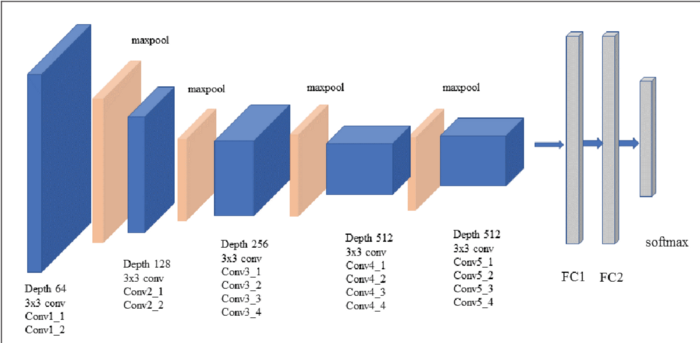
Una capa con $N_{l}$ filtros especificos tienen $N_{l}$ feature maps cada una de tamaño $M_{l}=H_{l}\times W_{l}$ (the height and width of the feature map quer definimos con las parametros img_rows and img_columns respectivamente). En este caso $N_{l}=64,128,256,512,512$. Ademas cada capa tiene tres colores. Podemos entonces representan una capa particular por un tensor (layer_features) de dimensión $(W_{l}, H_{l}, N_{l})$ con $H_{l}=\text{img\_rows},\text{img\_rows/2},\text{img\_rows/4},\text{img\_rows/8}$, $H_{l}=\text{img\_columns},\text{img\_columns/2},\text{img\_columns/4},\text{img\_columns/8}$ and $N_{l}=64,128,256,512$. 

En el articulo, representan estos features por $F_{ij}^{l}$ donde l indica cuand profundo estamos en la red convolucional, el primer sub indice indice ($"i"$) indica cual mapo especifico es y el otro es valro especifico (despues de la activación). Es decir por un valor especifico de $l$ and $i$, $F_{ij}^{l}$ es un vector de dimensión $M_{l}=H_{l}\times W_{l}$. Dicho de otro modo, la repuesta de una capa $l$ puede estar guardada en una matriz $F^{l}\in\mathcal{R}^{N_{l}\times M_{l}}$.

Para evaluar el estilo, en lugar de comparar pixel a pixel los resultados de las capas dela red VGGn-19, se eligio capturar la correlaciones entres los distinctos filtros a un mismo nivel; la idea subyacente es que el “estilo” es mas relacionado con estructura subjacente a un nivel de resolución (es decir de longitud de correlación) dado y por lo tanto correlaciones entres diversos filtros indican esta similitud. 

Para implementarlo, los autores introducen la matriz de Gram, $G^{l}\in\mathcal{R}^{N_{l}\times N_{l}}$, donde los elementos de dicha matriz $G_{ij}^{l}$ estan dado por el producto escalar entre los features map vectorizado (es decir se hizo un flatten para pasar de una matriz a un vector)$G_{ij}^{l}=\sum_{k}F_{ik}^{l}F_{jk}^{l}$.

Como para un mismo valor de $l$ y de $i$, los $F_{ij}$ tienen todos la misma cantidad de elementos (dados por $j$) obtendremos una matrix cuadrada de tamaño $N_{l} \times N_{l}$. Veamos ahora el detalle del codigo para lograr esto. 

En el codigo de arriba, $x$, es un tensor de dimensión $(W_{l},H_{l},N_{l})$. Permutando la dimensiones obtenemos $(N_{l,}W_{l},H_{l})$. El flatten lo transforma en $(N_{l},M_{l})$ donde $M_{l}=H_{l}\times W_{l}$. Ahora si hacemos un transpose obtenemos $(M_{l},N_{l})$. Finalmente el K.dot resulta en $(N_{l},N_{l})$ donde cada elemento de este array es el producto escalar entre los dos vectores (en el sentido mathematico) de tamaño $M_{l}$. Hay que notar que esta matriz tendra en la diagonal el producto del feature pr si mismo, si uno normaliza esta matriz uno podria esperar que la diagonal da 1 pero de hecho dar ligeramente menor pues los valores que multiplicamos son obtenidos post activación y como es una relu, algunos elementos pueden ser 0. 

In [12]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses:

Explicar qué mide cada una de las losses en las siguientes tres celdas.

Rta:

La primera: “style_loss” es la loss relacionado con el estilo basado en la matrice de Gram y se obtiene minimizando la distancia cuadratica media entre la matrice de Gram calculada de la imagen original y la matrice de Gram dela imagen a generar. Siendo $\vec{a}$ y $\vec{x}$ la imagen original y la imagen a generar y $A^{l}$ y $G^{l}$ sus respectivas matrices de Gram para la capa l, la contribución de esta capa a la style_loss esta dado por $$E_{l}=\frac{1}{4N_{l}^{2}M_{l}^{2}}\sum_{i,j}\left(G_{ij}^{l}-A_{ij}^{l}\right)^{2}$$

la loss total es $$\mathcal{L}_{style}(\vec{a},\vec{x})=\sum_{l}w_{l}E_{l}con w_{l}$$ los pesos especificos de la contribución de cada capa; habitualmente el mismo valor para todas las capas activas (en el articulo, utilizan $w_{l}=0.2$ porque utilizaran 5 layers para hacer la transferencia; en el Trabajo_Final.py se divide por la cantidad de layers que se utiliza generalizando la idea conceptual del artículo). 

La segunda: “content_loss” es la loss relacionada con la imagen inicial. Para visualizar la información que esta encadada en distinctas capas de la hierarquía, aplican gradient descent sobre una imagen de ruido blanco para encontrar otra imagen que matchea a respuesta de los features de la imagen original. Es decir, sea $\vec{p}$ la imagen original y $\vec{x}$ la imagen generada y $P^{l}$ y $F^{l}$ las respectivas representaciones de los features para el layer $l$. Definen una loss:$$\mathcal{L}_{\text{content}}\left(\vec{p},\vec{x},l\right)=\frac{1}{2}\sum_{i,j}\left(F_{ij}^{l}-P_{ij}^{l}\right)^{2}$$

Recuerden que queremos obtener una nueva imagen $\vec{x}$, que obtendremos multiplicando la imagen original por los nuevos pesos obtenidos minimizando la Loss. En este caso, el papel de las anotaciones esta dado por los $P_{ij}^{l}$. Entonces, la imagen aleatorio inicial $\vec{x}$ esta modificada hasta que genera la misma repuesta que una capa determinada dela capa de la CNN the la imagen original.

La tercera “total_variation_loss” es un filtro que trata de penalizar los cambios bruscos entre pixeles adjacentes; suiviza la imagen final. La loss propuesta en el notebook inicial no es la sola manera de implementar esta total_variation_loss, agregue otra llamanda total_variation_loss_iso que es la suma de la diferencias al cuadrados de lso pixeles adjacentes horizontal y vertical; muy parecida a una loss de penalización $l_2$. 
La loss total es una combinación lineal de las loss individual comentado anteriormente:

$$\mathcal{L}_{transfer}=\alpha\mathcal{L}_{\text{content}}\left(\vec{p},\vec{x},l\right)+\beta\mathcal{L}_{style}(\vec{p},\vec{x})+w_{denoise}\mathcal{L}_{denoise}(\vec{x})$$

In [13]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    # channels = 3
    # size = img_nrows * img_ncols
    Ml2 = int(style.shape[0] * style.shape[1])**2
    Nl2 = int(style.shape[2])**2 
    return K.sum(K.square(S - C)) / (4.0 * Nl2 * Ml2)

In [14]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


In [15]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


In [16]:
def total_variation_loss_iso(x):
    assert K.ndim(x) == 4
    a = K.abs(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.abs(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(a + b)

In [17]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block4_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)
# loss = loss + total_variation_weight * total_variation_loss_iso(combination_image)

In [18]:
grads = K.gradients(loss, combination_image)

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

# 6) Explique el propósito de las siguientes tres celdas. ¿Qué hace la función fmin_l_bfgs_b? ¿En qué se diferencia con la implementación del paper? ¿Se puede utilizar alguna alternativa?

Respuesta:

eval_loss_and_grad() es una función que devuelve el valor de la loss y de del gradiente grad. Utilisa f_output de finido en la celda anterior.
La clase evaluator permite dar la loss o el gradiente que calcula en un solo paso. 
bfgs (un acronimo paar descrinir el algopritmo de Broyden–Fletcher–Goldfarb–Shanno) es un optimisador que utiliza una estimación del Hessiamo para explorar el espacio de la función (la loss en este caso) y encontra el minimo. l-BFGS es un algorithmo que aproxima el algoritmo Broyden–Fletcher–Goldfarb–Shanno (BFGS) utilizando una cantidad limitada de memoria. Utiliza un algoritmo recursivo bastante complejo para calcular el Hesiano inverso pero lo importante para nosotros es que necesita la función y su gradiente para iterar. 
Si bien es eficiente, como tenemos basicamente loss cuadraticas, otro optimazador podria ser utilisado; ADAM por ejemplo (ver run_4). 

In [19]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

In [20]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

Start of iteration 0
Current loss value: 2234494200000.0
Image saved as D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/output/run_2a/output_at_iteration_0.png
Iteration 0 completed in 133s
Start of iteration 1
Current loss value: 1348275500000.0
Image saved as D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/output/run_2a/output_at_iteration_1.png
Iteration 1 completed in 134s
Start of iteration 2
Current loss value: 1070097560000.0
Image saved as D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/output/run_2a/output_at_iteration_2.png
Iteration 2 completed in 134s
Start of iteration 3
Current loss value: 925525100000.0
Image saved as D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/output/run_2a/output_at_iteration_3.png
Iteration 3 completed in 135s
Start of iteration 4
Current loss value: 837698300000.0
Image saved as D:/Marc/Anaconda/Trabajo _final_Computer_Vision/content/output/run_2a/output_at_iteration_4.png
Iteration 4 completed in 139s
Start of ite

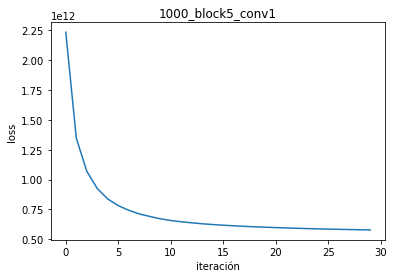

135.43005159474671
125.34504221388367
116.87196060037523
imagen final:  [135.43005159 125.34504221 116.8719606 ]
imagen inicial:  [154.05228 139.01239 118.69832]
imagen de ruido:  [126.83828799 127.22834897 126.82772514]


In [21]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
# x = preprocess_image(base_image_path)
x = preprocess_image(noise_image_path)
loss_graficar = []
qq = []

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                   fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    loss_graficar.append(min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    qq.append(img)
    # fname = result_prefix / ('output_at_iteration_%d.png' % i)
    d = i
    fname = f'{result_prefix}output_at_iteration_{d}.png'
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))
    
plt.plot(loss_graficar)
plt.xlabel('iteración')
plt.ylabel('loss')
plt.title(f'{style_weight}_{feature_layers[len(feature_layers)-1]}')
plt.savefig(f'{result_prefix}loss_graficar.png')
plt.show() 


print(qq[iterations-1][:,:,0].mean())
print(qq[iterations-1][:,:,1].mean())
print(qq[iterations-1][:,:,2].mean())
print('imagen final: ',np.mean(qq[iterations-1], axis=tuple(range(qq[0].ndim-1))))
print('imagen inicial: ',list_media)
print('imagen de ruido: ', np.mean(noise, axis=tuple(range(noise.ndim-1))))

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias. (Adjuntar las imágenes generadas como archivos separados.)

Respuesta:

# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

## Repuesta pregunta # 8:

Para facilitar el analisis, vamos a fijar un ciertas cantidad de hiperparametros que considero menos interesantes o subjectivos:

1) cantidad de iteraciones: 30

2) La imagen de content: Tuebingen_Neckarfront.jpg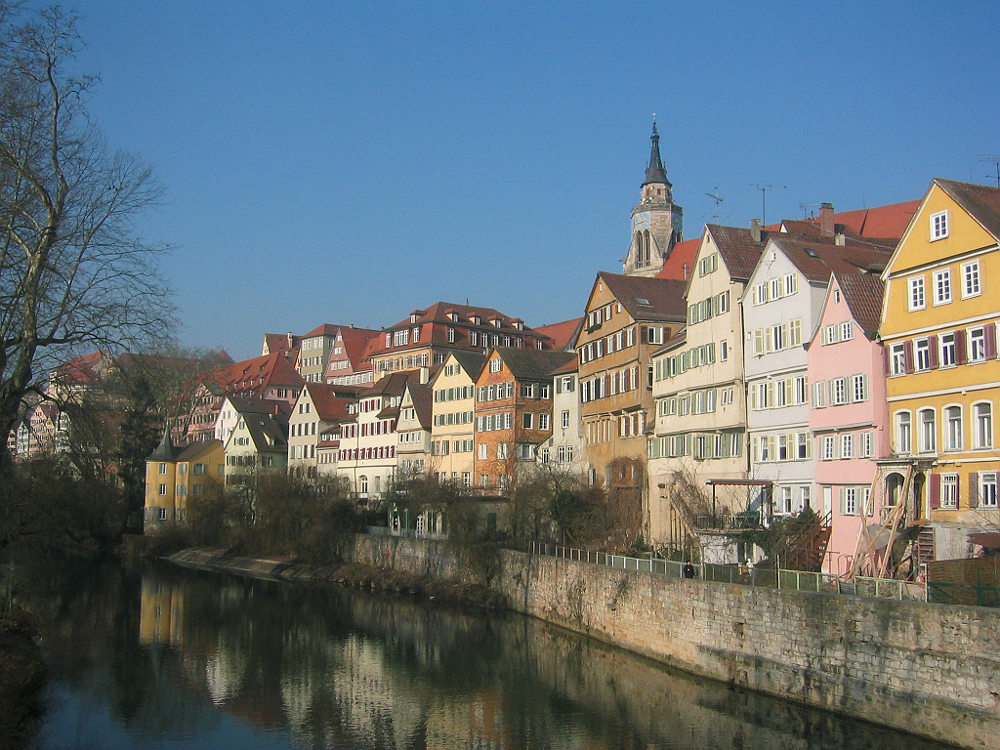

3) La imagen de estilo: composition-vii.jpg
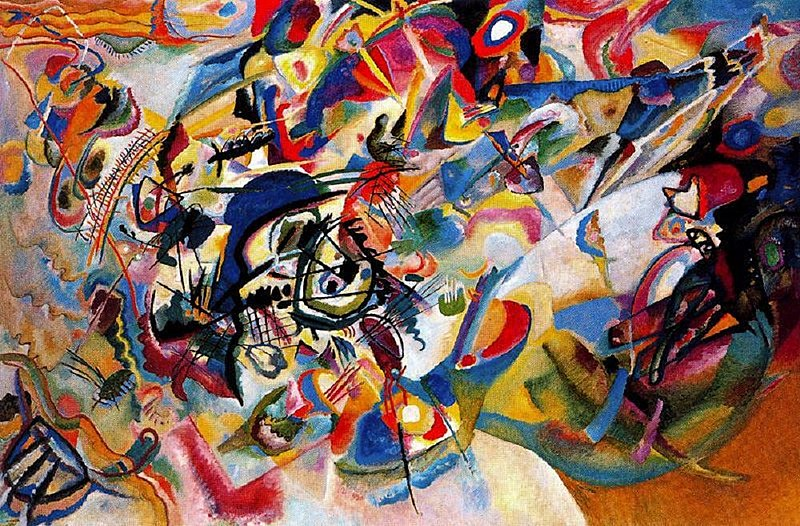

No voy a hacer un analisis exaustivo y nos concentraremos en los pesos paar las diversas loss pero como veremos, estos valores dependen de los otros parametros también. Abajo hay un resumen de los parametros elegidos para las corridas testigos. Empezamos por una breve descrición de cada hiperparametro:
1. run: El id de la run
2. noise_image: Indica si usamos como punto de partida una imagen de ruido blanco uniforme (pdf: uniforme(0,255)). 
3. content_image: indica si utilizamos como punto de partida la imagen de contenido y especificamso el nombre del jpg. 
4.  $\alpha$ es el peso para la content_loss; $\beta$ es el peso para la Style_loss; $\alpha/\beta$ es la razón de ambas. 
5. $\omega_{denoise}$ es el peso para la total_variation_loss; luego se indica la potencia en la cual se eleva la suma a + b.
6. La resolución del output
7. El layer feature for the content_loss que se utilisara
8. The features_layers of the style_loss utilisadopara calcular las diversas matrices de Gram. 
9. El optimizer que se uso
10. El nombre del directorio donde se guardo las iteraciones y el grafico de la loss (obviamente, este último no es un hiperparametro; es solo para ordenar los outputs). 


| run    | noise_image | content_image | $\alpha$,$\beta$,$\alpha/\beta$ | $\omega_{denoise}$/type |resolución final | layer_feature of content_loss |  features_layers of the style_loss | optimizer | output_dir
| :------| :---------- | :-------------|:-------------------|:-----------|:----------|:---|:---|:---|:---|
| 1a     | N/A         | Tuebingen_Neckarfront.jpg |1, 1000, 0.001       |1; power = 1       |400  | 'block4_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_1a|
| 1b      | N/A         | Tuebingen_Neckarfront.jpg |1, 100, 0.01       |1; power = 1       |400   | 'block4_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_1b|
| 1c      | N/A         | Tuebingen_Neckarfront.jpg |1, 100, 0.01       |1; power = 1       |400   | 'block5_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_1c|
| 1d      | N/A         | Tuebingen_Neckarfront.jpg |1, 100, 0.01       |0       |400        | 'block5_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_1d|
| 2a      | Si          | N/A            |1, 1000, 0.001    |1; power = 1           |400   | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_2a|
| 2b      | Si          | N/A            |1, 100, 0.01      |1; power = 1           |400    | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_2b|
| 2c      | Si          | N/A            |1, 100, 0.01      |100; power = 1           |400    | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_2c|
| 2d      | Si          | N/A            |1, 1000, 0.001      |1; power = 1.25       |400     | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_2d|
| 2e      | Si          | N/A            |1, 100, 0.01      |1; power = 1.25           |400        | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_2e|
| 3a      | Si          | N/A            |1, 100000, 0.001      |100; power = 1         |400        | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_3a|
| 3b      | Si          | N/A            |1, 100000, 0.001      |100: 1.25         |400        | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_3b|
| 3c      | Si          | N/A            |1, 100000, 0.001      |100:2         |400        | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_3c|
| 4      | N/A  | Tuebingen_Neckarfront.jpg      | 1e-4, 1e-2, 0.01      |0          |400        | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |Adam |run_4|
| 5      | Si        | N/A         |N/A     |1;1.25          |400       | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_5|
| 6      | Si        | N/A         |1, 1000 0.001      |10;1.25        |full_res| 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_6
| 7      | Si        | N/A        |1, 1000, 0.001      |10; power = 1       |400     | 'block4_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_7
| 8      | Si        | N/A            |1, 1000, 0.001   |10; power = 1      |400        | 'block5_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_8|
| 9      | Si        | N/A            |1, 100, 0.01     |10; power = 1      |400        | 'block5_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_9|
| 10     | Si        | N/A            |1, 1, 1      |1       |400        | 'block5_conv2'  | 'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_10|

run_1a

Para la corrida 1, se utilizo como imagen de partida la imagen de la content_loss. La primera tiene una razón entre content/style de 0.001 y la segunda de 0.01. La tercera, run_1c, tiene menos iteraciones pero la content sufre mas deformación debido al aporte de un layer mas profundo (ver la notebook adjunta Trabajo_Final_Content). 
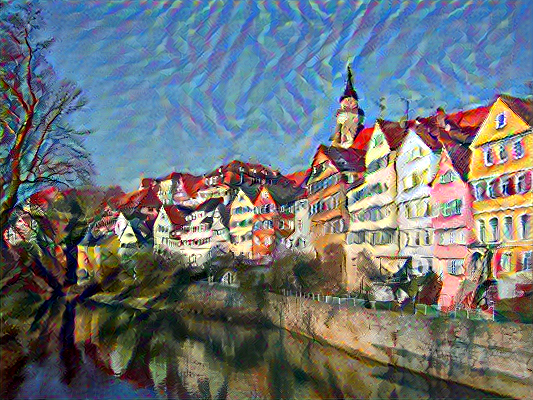

run_1b
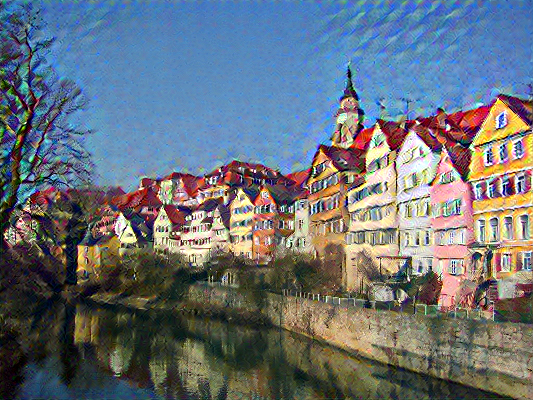

run_1c
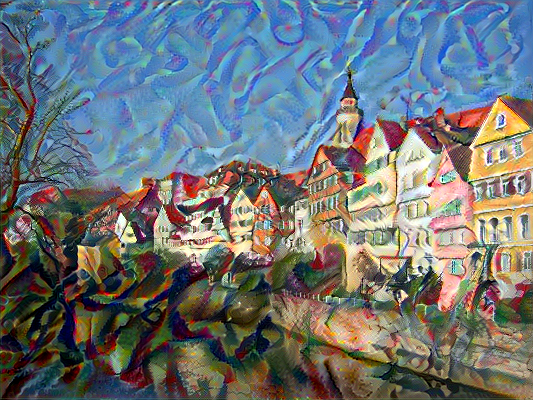

run_1d
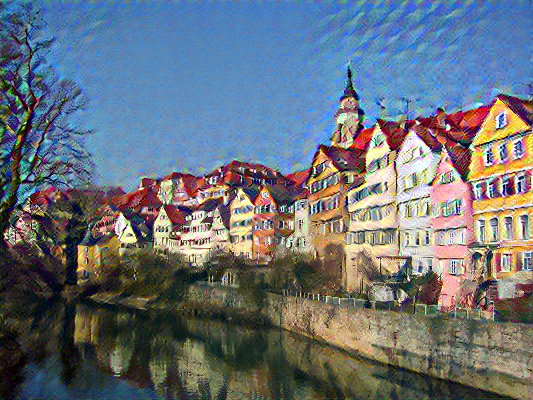

run_2a 

El grupo de corrida 2, es similar al grupo 1 pero el punto de partida es un imagen de ruido blanco uniforme. Hay dos hyperparametros que estudiamos en la corrida 2, la razón entre loss_content y style_loss y el efecto de la total_variation_loss. 

1. Comparar la 2a vs la 2d para ver la diferencia entre utilizar la potencia = 1 y 1.25 en la total_variation_loss con loss_content/style_loss = 0.001

2. Comparar la 2b vs la 2e para ver la diferencia entre utilizar la potencia = 1 y 1.25 en la total_variation_loss con loss_content/style_loss = 0.01

En ambos casos el resultado es muy similar indicando que el impacto de la potencia utilizada es minima. No obstante, si uno sube el peso relativo de la total_variation_loss, se empezar a notar diferenmcia mas importante (ver corrida 3). 

También se puede comparar con la corrida 1 para ver el impacto en le resulatdo final de la imagen de entrada. En particular es interesante compara la corrida 1a contra la corrida 2a (o 2c). Obviamnete, la imagen de content, para mismo valor de parametros, es mucho mas presente en el resultado final. Para valores relativamente bajas de la razón $\alpha$/$\beta$, el resultado es siempre muy diferente. 

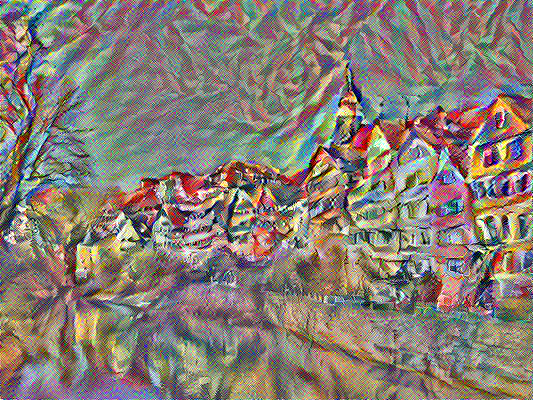

run_2b
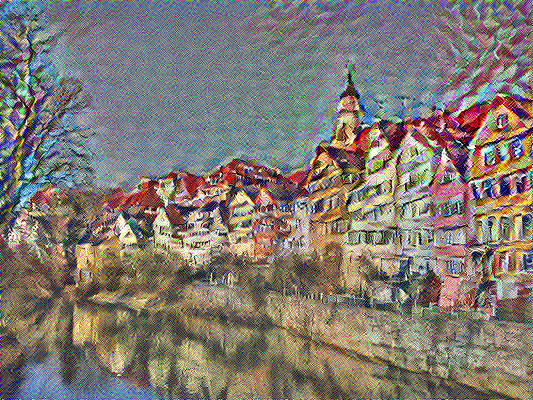

run_2c
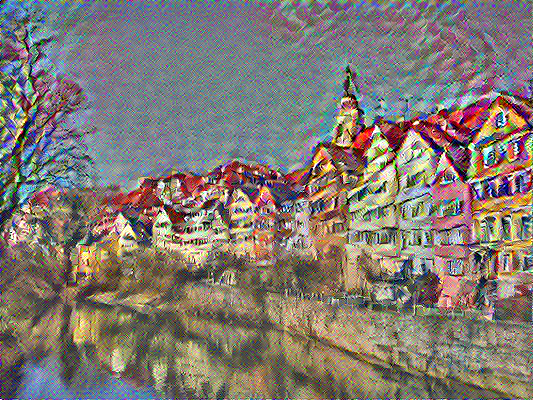

run_2d

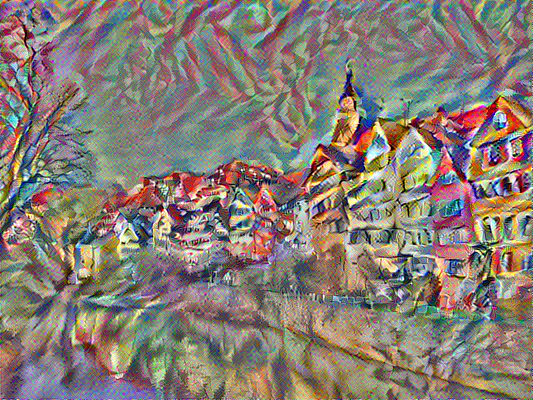

run_2e

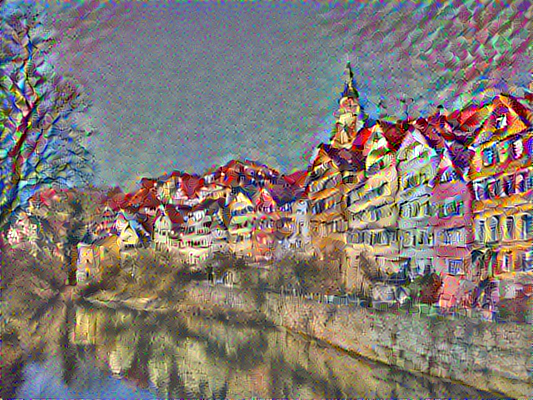

run_3a: 

En el grupo tres, se fija un peso elevado para la style_loss y  total_variation_loss y se ve el impacto de la total_variation_loss cambiando la potencia de 1 (run_3a) a 1.25 (run_3b) a 2 (run_3c). El augmentio de la potencia resulta en uan penalización mas fuerte de los cambios provocando mas aglomeración de las regiones espacials cercanas. 

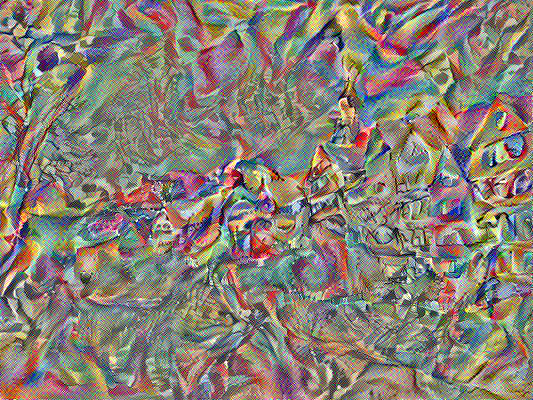

run_3b
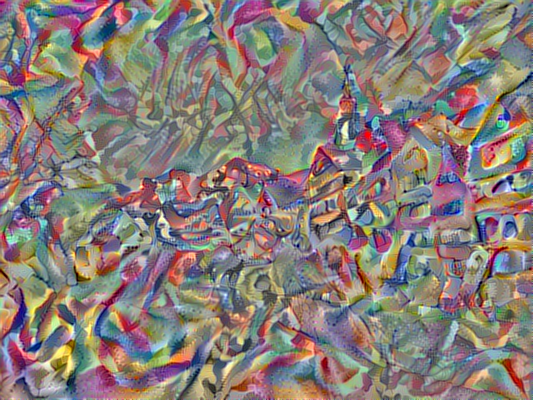

run_3c
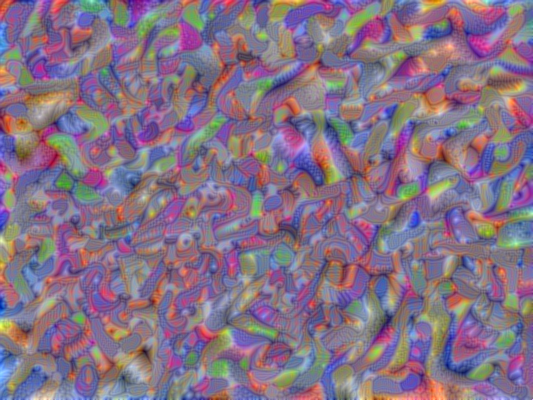

run_4

Esta imagen fue generada por el programa: "Style_Transfert_Tensor_Flow.py" (ver comentario arriba). Los hiperparmetros de ADAM fueron sacado de la página web donde encontre el código base para escribir el python. Si uno pone valores grandes para los weights, la loss se vuelve muy grande y no se produce resulatdo; salvo para los valores absolutos para los pesos, los parametros son iguales que para la run 1_d para poder comparar resultados finales. Pero la cantidad total de interaciones es distinctas: 400 para Adam; 30 para l_bfgs_b. 

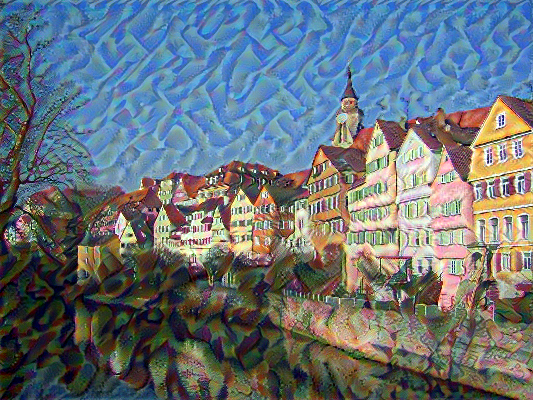

run_5

La corrida 5 investiga el efecto de la total_variation_loss tomada como unica loss sobre una imagen de ruido. Como esta loss penalisa cambio brusco vertical o horizontal, en una imagen puramente aleatoria, debería producir una mezcla abarcando cada vez area mas grande reemplazando el input inicial por una mezcla cada vez mas homogenea. Por lo tanto el resulatdo final deberia ser una imagen blanca pues los tres canales de colores deberian ser cada vez mas parecidos pixel a pixel.

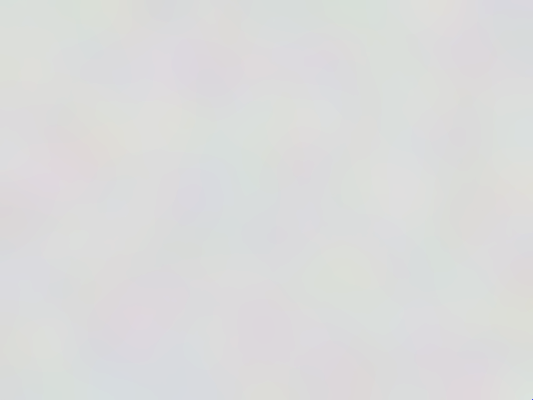

run_6 

La run 6 solamente el efecto de utilizar una resolución mas grande.  Se utilizo un peso de 10 y la potencia = 1.25. 

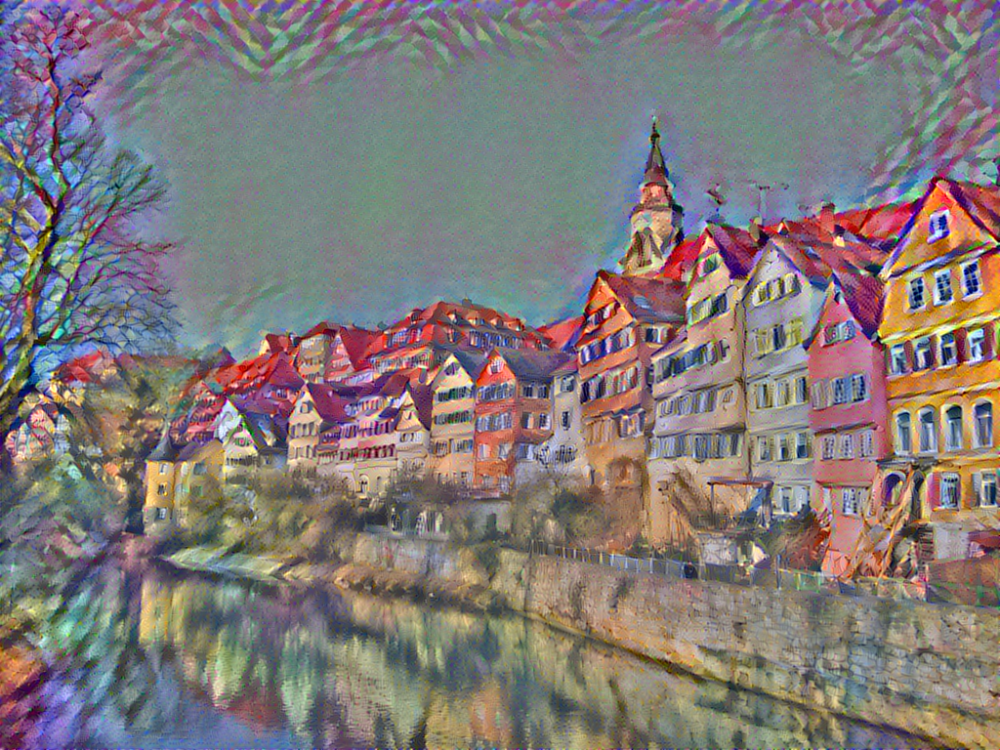

run_6b 

Idem que el anterior pero con la potencia en la total_variation_loss = 1. Se ve el efecto de granulación mas fina, es decir el filtro es menos potente. 

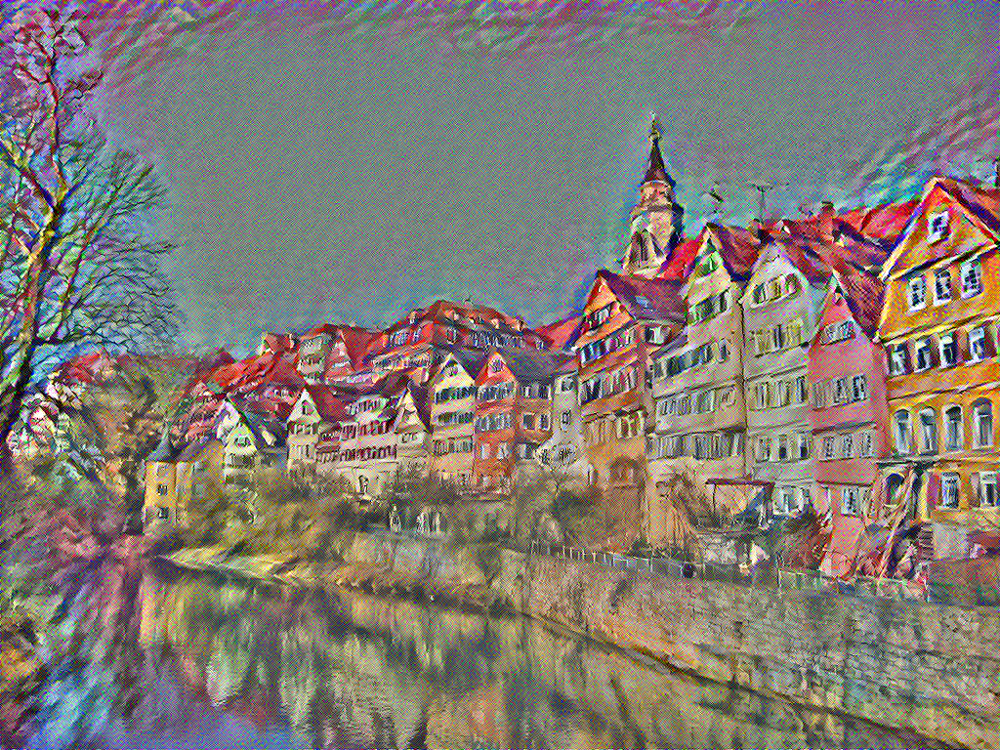

run_7 

Las corridas 7, 8, 9 y 10 dan idea del impacto de la profundidad empleada para el style_content_loss. En los cuatro casos, se utilizo feature_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']. La diferencia entre la corrida 7 y la 8 es la layer feature of content_loss 'block4_conv2' para la 7 y 'block5_conv2' paar la 8. Para la corrida 9 se bajo la weight de style_loss a 100 ($alpha$/$beta$ = 0.01) y para la 10 $alpha$/$beta$ = 1. 

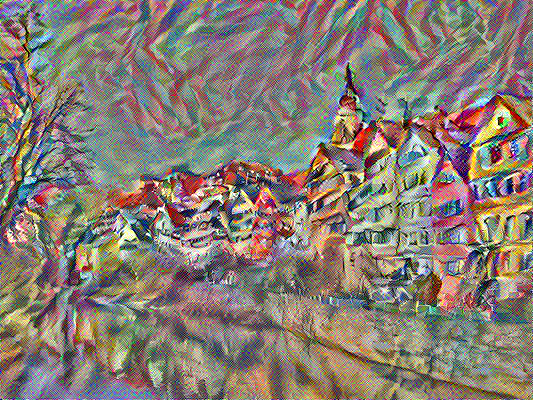

run_8. 

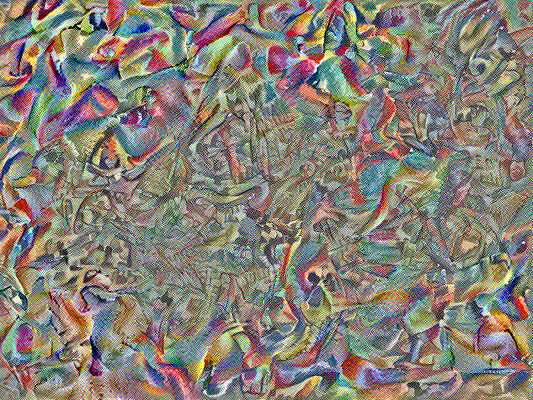

run_9
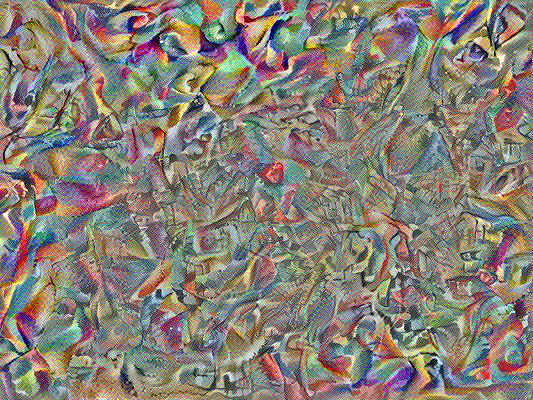

run_10
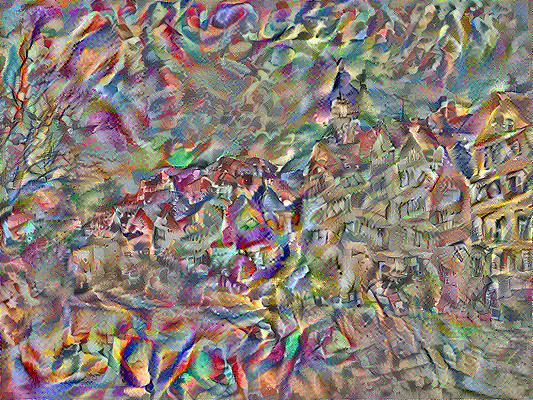

## Repuesta pregunta # 9:

| run    | noise_image | content_image | $\alpha$,$\beta$,$\alpha/\beta$ | $\omega_{denoise}$/type |resolución final | layer_feature of content_loss |  features_layers of the style_loss | optimizer | output_dir|style_image|
| :------| :---------- | :-------------|:-------------------|:-----------|:----------|:---|:---|:---|:---|:---|
| 11     | si         | N/A |0.01, 1, 0.01       |1; power = 1.25      |full res  | 'block4_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_11|La_noche_estrellada1.jpg
| 12     | si         | N/A |0.001, 1, 0.001       |1; power = 1.25      |full res  | 'block4_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block4_conv1','block5_conv1'  |l_bfgs_b|run_12|Pablo_Picasso_1913-14_L_Homme_aux_cartes_oil_on_canvas.jpg
| 13     | si         | N/A |0.001, 1, 0.001       |1; power = 1.25      |full res  | 'block4_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block5_conv1','block5_conv1'  |l_bfgs_b|run_13|Shipwreck_turner.jpg
| 13     | si         | N/A |0.001, 1, 0.001       |1; power = 1.25      |full res  | 'block5_conv2'  |   'block1_conv1','block2_conv1', 'block3_conv1','block5_conv1','block5_conv1'  |l_bfgs_b|run_13|Pablo_Picasso_1913-14_L_Homme_aux_cartes_oil_on_canvas.jpg

content_image: 
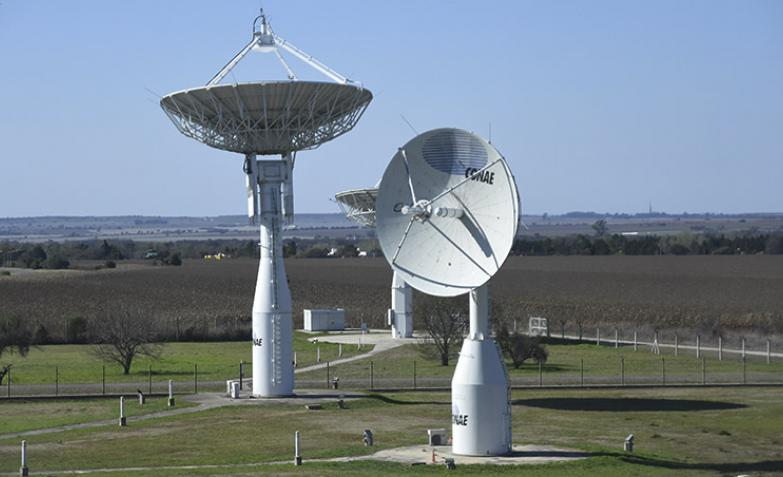

run_11

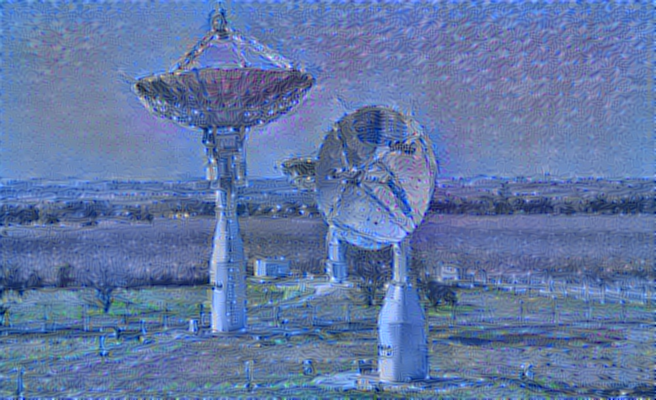

run_12

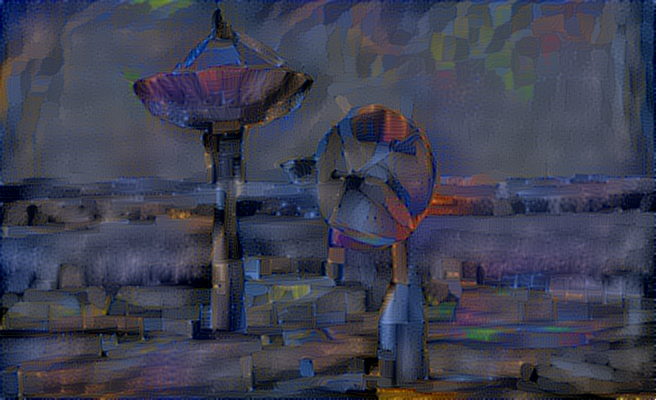

run_13

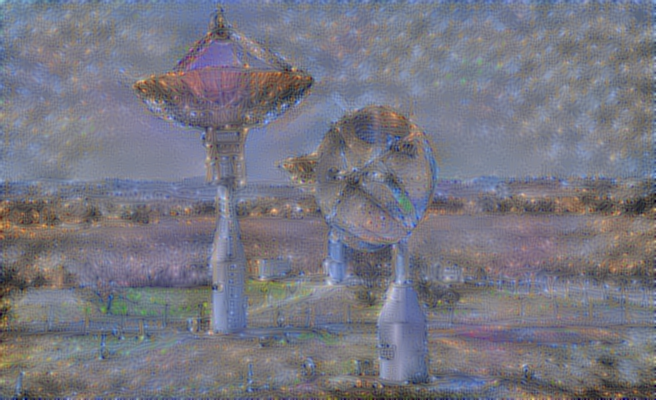

run_14

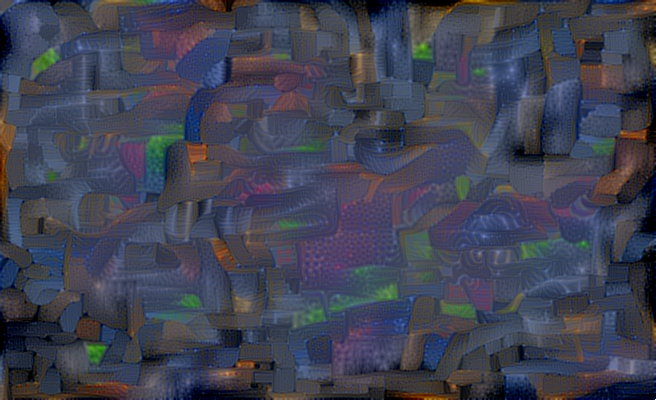